## Import

In [147]:
import pandas as pd
import numpy as np
import scanpy as sc
import os
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.patches as mpatches
from sklearn.preprocessing import StandardScaler
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from matplotlib.lines import Line2D

In [2]:
output_path = "output_phenotypes"

## Load

In [33]:
input_path = "../input data/crca_xenium.h5ad"
adata = sc.read_h5ad(input_path)

In [34]:
adata

AnnData object with n_obs × n_vars = 3706544 × 380
    obs: 'cell_id', 'name', 'slide', 'tissue_region', 'patient_id', 'crca_id', 'crca_patient_id', 'msi_status', 'stage', 'age', 'sex', 'KRAS', 'BRAF', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segm_meth', 'segmentation_method', 'region', 'z_level', 'cell_labels', 'transcript_density', 'mean_neighbor_dist', 'scvi130_nb_leiden_2.5', 'scvi130_nb_leiden_3.8', 'anno_notes', 'celltype', 'celltype_sub', 'CN', 'Neutrophil', 'Niche'
    uns: 'colors', 'delaunayr50_nb', 'delaunayr50_neighbors', 'log1p', 'nichecompass_umap', 'scvi130_nb', 'scvi130_nb_leiden_1_rank', 'scvi130_nb_umap', 'spatialdata_attrs'
    obsm: 'delaunayr50', 'nichecompass_umap', 'norm_pca', 'norm_pca_nb_umap', 'scvi', 'scvi130_nb_umap', 'spatial'
    varm: 'nichecompass_gp_sources', 'nichecompass_gp_

In [35]:
adata_all_regions = adata.copy()

# keep only core and margin
adata = adata[adata.obs['tissue_region'].isin(['core', 'margin'])].copy()

In [36]:
# normalize 
adata.X = adata.layers['norm'].copy()

## Define Center and Border

In [37]:
border_mask = adata.obs['Niche'].str.startswith('Stromal')
center_mask = ~border_mask

adata.obs['phenotype_region'] = np.where(center_mask, 'center', 'border')

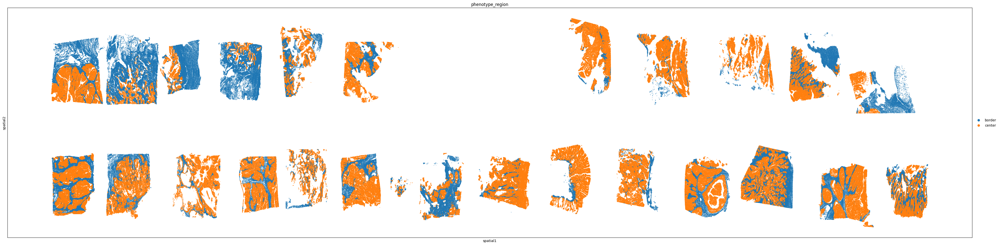

In [38]:
fig = sc.pl.embedding(
    adata,
    basis="spatial",
    color='phenotype_region',
    show=False,
    return_fig=True,
    size=2
)

fig.set_size_inches(50, 12)
fig.show()

## CD8+ T cell mask

In [39]:
t_cells = sc.read_h5ad(os.path.join('output', 't_cells.h5ad'))

In [40]:
cd8_ids = t_cells.obs.loc[t_cells.obs['is_CD8'], 'cell_id']
adata.obs['is_CD8'] = adata.obs['cell_id'].isin(cd8_ids).astype(bool)

## Compute CD8+ T cells fraction per region per sample

In [125]:
fractions_patient = (
    adata.obs.groupby(["patient_id", "phenotype_region"])["is_CD8"]
    .mean()  # mean of booleans = fraction of Trues
    .unstack()
)

fractions_patient['ratio_border_center'] = fractions_patient['border'] / (fractions_patient['center'] + 1e-10) # to be sure we're not 0-dividing 

/tmp/ipykernel_3425795/1082259549.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  adata.obs.groupby(["patient_id", "phenotype_region"])["is_CD8"]


In [126]:
fractions_patient

phenotype_region,border,center,ratio_border_center
patient_id,,,
a,0.030303,0.022413,1.352008
b,0.032369,0.005199,6.225803
c,0.012772,0.003949,3.233794
d,0.009373,0.002266,4.136741
e,0.013306,0.009336,1.425271
f,0.015184,0.013528,1.122429
g,0.003348,0.000994,3.368764
h,0.007954,0.001210,6.573643
i,0.018672,0.005833,3.200860


## Classification of phenotypes

### With arbitrary thresholds

In [153]:
border_median = fractions_patient['border'].median()
center_median = fractions_patient['center'].median()

print(f"Border median = {border_median:.5f}, Center median = {center_median:.5f}")

Border median = 0.01518, Center median = 0.00583


In [160]:
border_th = border_median*0.75
center_th = center_median*0.75
print(f"Border threshold = {border_th:.5f}, Center threshold = {center_th:.5f}")

Border threshold = 0.01139, Center threshold = 0.00438


In [161]:
ratio_thr = 2

def classify_phenotype(row, t_center, t_border, ratio_thr):
    c = row['center']
    b = row['border']
    ratio = row['ratio_border_center']
    
    if (c < t_center) and (b < t_border):
        return 'ignored'
    elif (b >= t_border) and (ratio > ratio_thr):
        return 'excluded'
    elif (b >= t_border) and (ratio <= ratio_thr):
        return 'inflamed'
    else:
        return 'ambiguous'

fractions_patient['phenotype_thresold'] = fractions_patient.apply(classify_phenotype, t_center=center_th, t_border=border_th, ratio_thr=ratio_thr, axis=1)

### With hierarchical clustering

In [128]:
# log transformation to highlight differences in fractions
fractions_patient['log_border'] = np.log10(fractions_patient['border'])
fractions_patient['log_center'] = np.log10(fractions_patient['center'])
fractions_patient['log_ratio'] = np.log10(fractions_patient['ratio_border_center'])

In [129]:
# new features
fractions_patient['border_plus_ratio'] = fractions_patient['border'] * fractions_patient['ratio_border_center'] # high value if high border fraction and high ratio
fractions_patient['border_minus_ratio'] = fractions_patient['border'] / (fractions_patient['ratio_border_center']) # high value if high border fraction and low ratio 

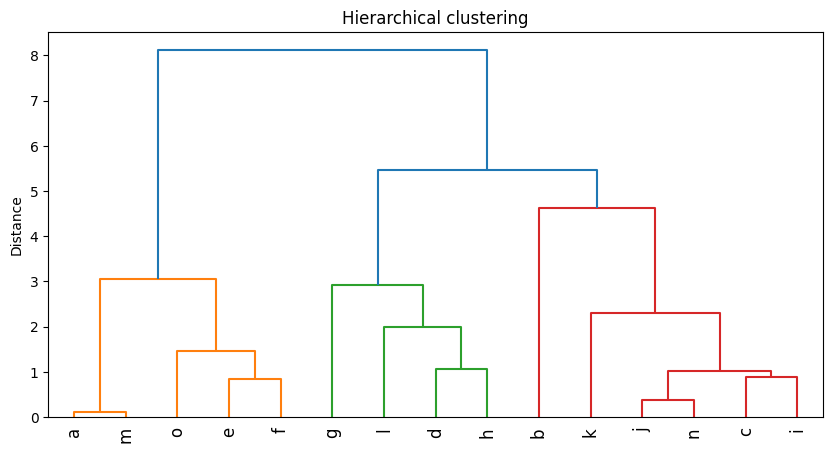

In [157]:
X = fractions_patient[['log_border', 'log_center', 'log_ratio', 'border_minus_ratio', 'border_plus_ratio']]

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# linkage with Ward method
linked = linkage(X_scaled, method='ward')

# dendrogram
plt.figure(figsize=(10,5))
dendrogram(linked, labels=fractions_patient.index.tolist(), color_threshold=5, leaf_rotation=90)
plt.title("Hierarchical clustering")
plt.ylabel("Distance")
plt.show()

fractions_patient['hier_cluster'] = fcluster(linked, t=3, criterion='maxclust')

/tmp/ipykernel_3425795/2544444938.py:22: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.text(x[i]+0.0005, y[i]+0.0005, txt, fontsize=15)


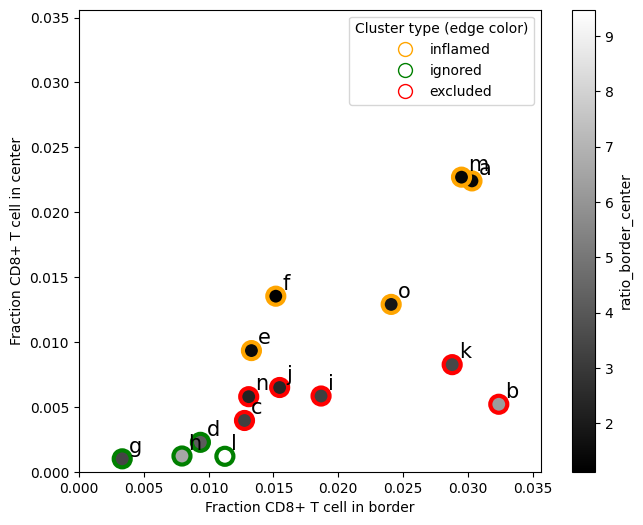

In [152]:
cluster_color_map = {1: 'orange', 2: 'green', 3: 'red'}
fractions_patient['hier_cluster_color'] = fractions_patient['hier_cluster'].map(cluster_color_map)

cluster_label_map = {1: 'inflamed', 2: 'ignored', 3: 'excluded'}
fractions_patient['phenotype_hier_cluster'] = fractions_patient['hier_cluster'].map(cluster_label_map)

plt.figure(figsize=(8,6))
scatter = plt.scatter(fractions_patient['border'],  # x
                      fractions_patient['center'],  # y
                      c=fractions_patient['ratio_border_center'], # color
                      cmap='gray', 
                      edgecolor=fractions_patient['hier_cluster_color'],
                      linewidths=3,
                      s=150 # point size
                     )  
plt.colorbar(scatter, label='ratio_border_center')
plt.xlabel('Fraction CD8+ T cell in border')
plt.ylabel('Fraction CD8+ T cell in center')

# add patients name
for i, txt in enumerate(fractions_patient.index):
    plt.text(x[i]+0.0005, y[i]+0.0005, txt, fontsize=15)

lims = [0, max(max(x), max(y))*1.1]  
plt.xlim(lims)
plt.ylim(lims)
plt.gca().set_aspect('equal', adjustable='box')

# legend
legend_elements = [Line2D([0], [0], marker='o', color='w', label=cluster_label_map[k],
                          markerfacecolor='w', markeredgecolor=v, markersize=10, linewidth=2)
                   for k, v in cluster_color_map.items()]
plt.legend(handles=legend_elements, title="Cluster type (edge color)")

plt.show()

In [162]:
fractions_patient

phenotype_region,border,center,ratio_border_center,log_border,log_center,log_ratio,border_plus_ratio,border_minus_ratio,hier_cluster,hier_cluster_color,phenotype_hier_cluster,phenotype_thresold
patient_id,,,,,,,,,,,,
a,0.030303,0.022413,1.352008,-1.518520,-1.649500,0.130979,0.040969,0.022413,1,orange,inflamed,inflamed
b,0.032369,0.005199,6.225803,-1.489874,-2.284069,0.794195,0.201521,0.005199,3,red,excluded,excluded
c,0.012772,0.003949,3.233794,-1.893752,-2.403465,0.509712,0.041301,0.003949,3,red,excluded,excluded
d,0.009373,0.002266,4.136741,-2.028117,-2.644775,0.616658,0.038774,0.002266,2,green,ignored,ignored
e,0.013306,0.009336,1.425271,-1.875949,-2.029846,0.153897,0.018965,0.009336,1,orange,inflamed,inflamed
f,0.015184,0.013528,1.122429,-1.818614,-1.868773,0.050159,0.017043,0.013528,1,orange,inflamed,inflamed
g,0.003348,0.000994,3.368764,-2.475235,-3.002706,0.527471,0.011278,0.000994,2,green,ignored,ignored
h,0.007954,0.001210,6.573643,-2.099418,-2.917225,0.817806,0.052286,0.001210,2,green,ignored,ignored
i,0.018672,0.005833,3.200860,-1.728805,-2.234071,0.505267,0.059767,0.005833,3,red,excluded,excluded


## Visual inspection

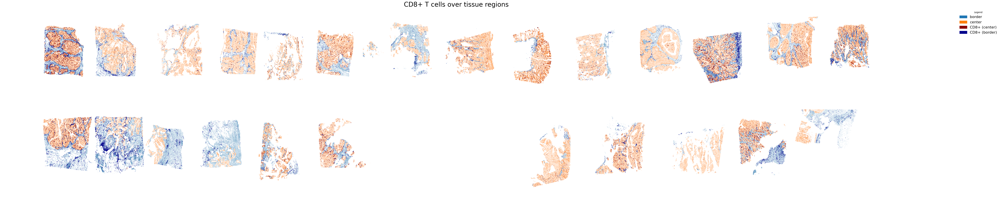

In [59]:
coords = adata.obsm["spatial"]

plt.figure(figsize=(60, 12))

# regions palette
region_colors = dict(zip(adata.obs['phenotype_region'].cat.categories, adata.uns['phenotype_region_colors']))
region_series = adata.obs['phenotype_region'].map(region_colors)

# plot regions
plt.scatter(coords[:, 0], coords[:, 1],
            c=region_series,
            s=1,
            alpha=0.08,
            edgecolor='none',
            zorder=1)

# plot CD8+ T cells in center (dark red)
cd8_center_mask = (adata.obs['is_CD8'] == True) & (adata.obs['phenotype_region'] == 'center')
plt.scatter(coords[cd8_center_mask, 0], coords[cd8_center_mask, 1],
            c='#8B0000',    
            s=2,
            alpha=0.9,
            edgecolor='none',
            zorder=2,
            label='CD8+ (center)')

# plot CD8+ T cells in border (dark blue)
cd8_border_mask = (adata.obs['is_CD8'] == True) & (adata.obs['phenotype_region'] == 'border')
plt.scatter(coords[cd8_border_mask, 0], coords[cd8_border_mask, 1],
            c='#00008B',
            s=2,
            alpha=0.9,
            edgecolor='none',
            zorder=2,
            label='CD8+ (border)')

plt.gca().invert_yaxis()
plt.axis('off')
plt.title("CD8+ T cells over tissue regions", fontsize=28)

# Legend
region_patches = [mpatches.Patch(color=color, label=region)
                  for region, color in region_colors.items()]
cd8_patches = [
    mpatches.Patch(color='#8B0000', label='CD8+ (center)'),
    mpatches.Patch(color='#00008B', label='CD8+ (border)')
]

legend_elements = region_patches + cd8_patches

# adjust legend
plt.legend(handles=legend_elements,
           bbox_to_anchor=(1.05, 1),   
           loc='upper left',
           fontsize=16,
           frameon=False,
           markerscale=3,
           title="Legend")

plt.tight_layout()
plt.show()


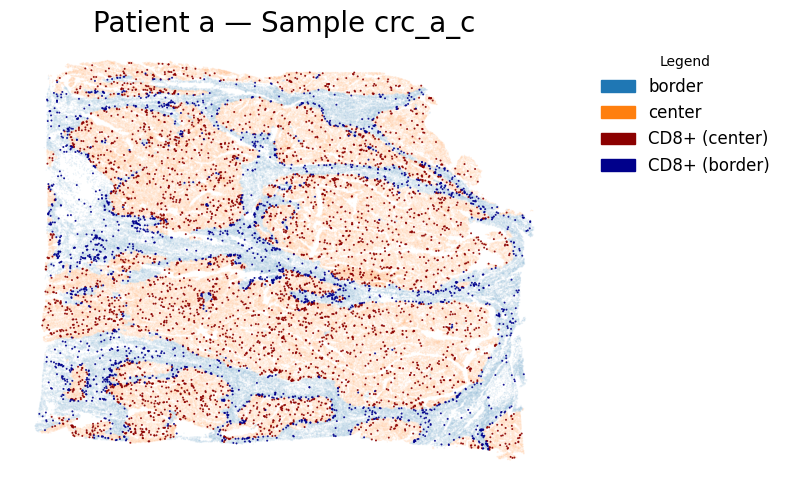

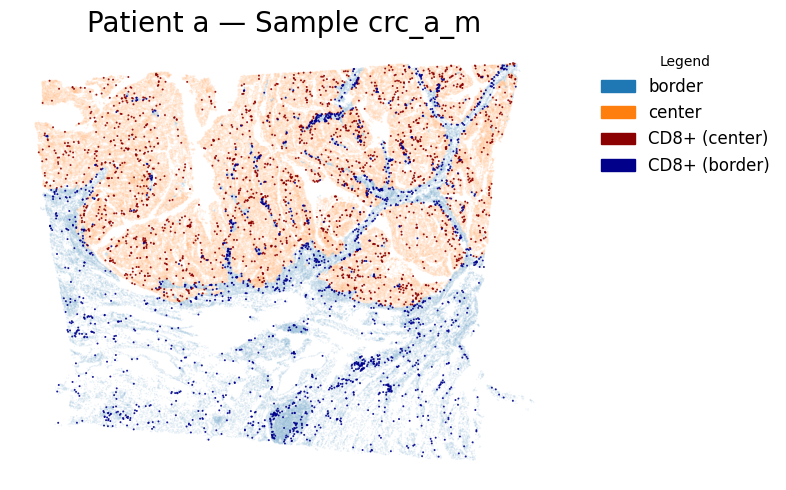

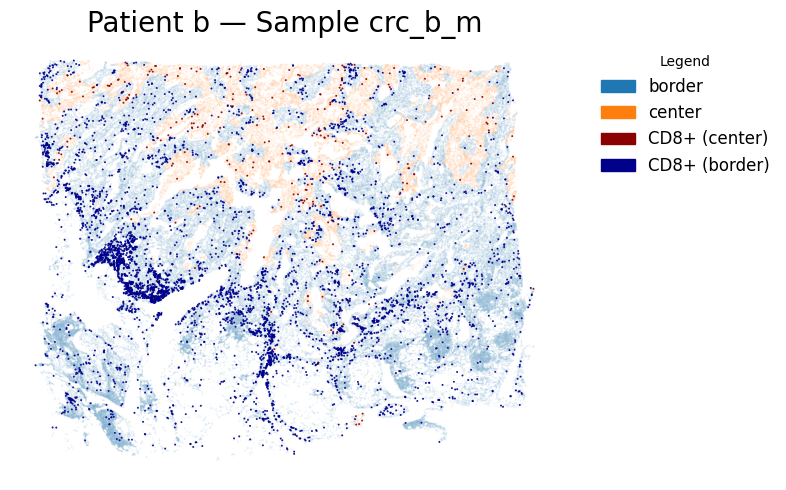

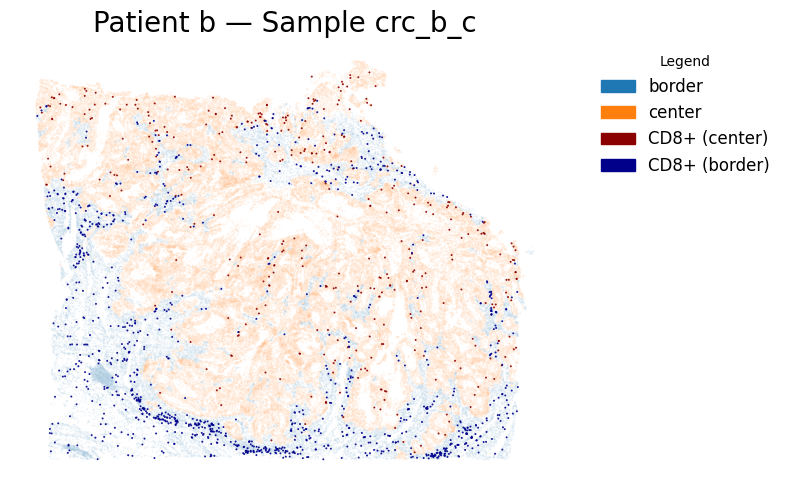

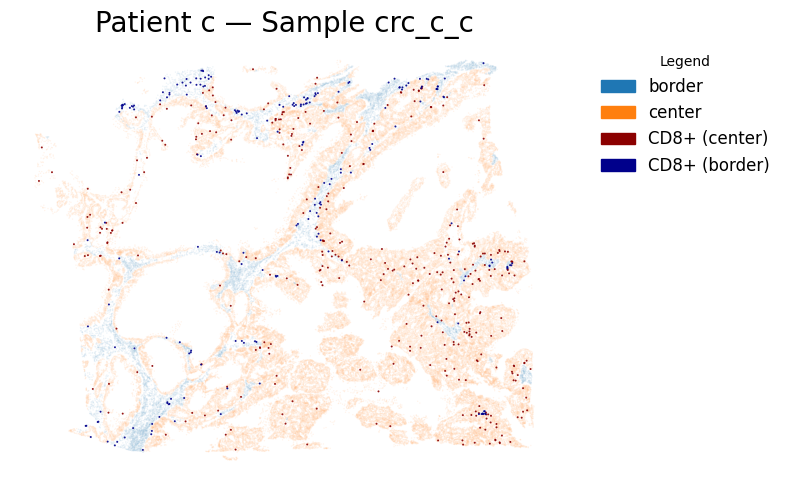

...

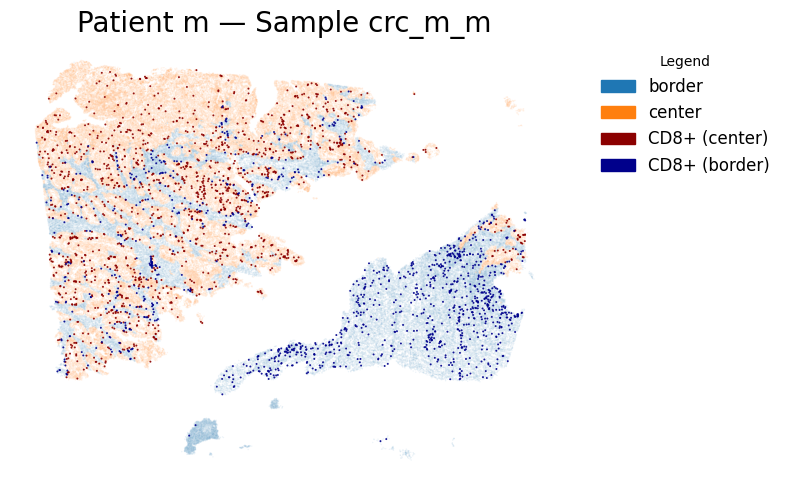

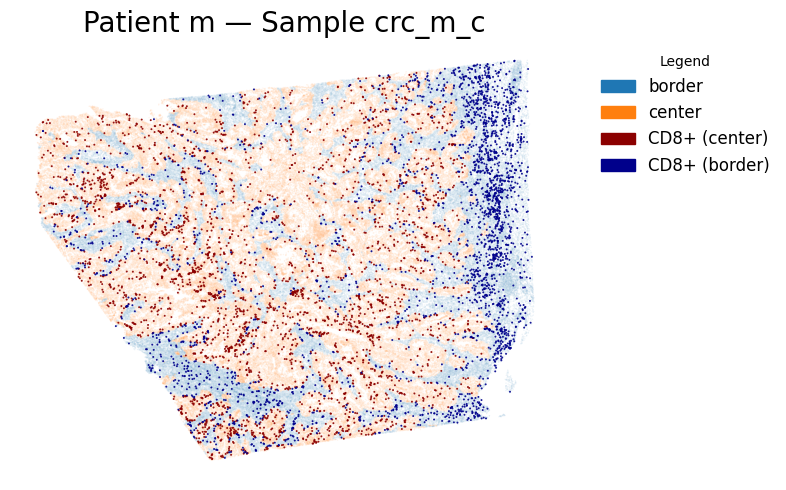

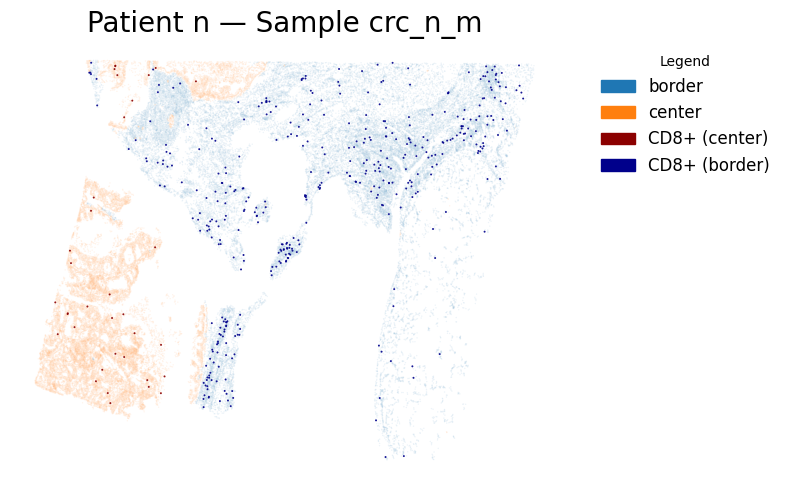

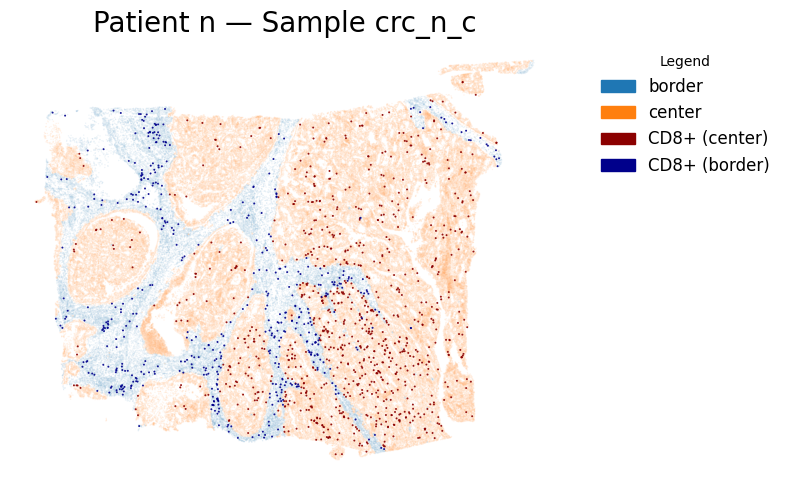

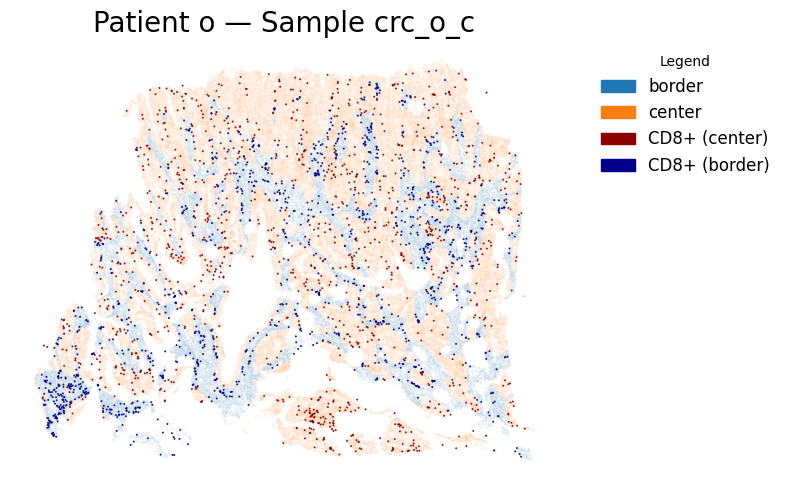

In [166]:
coords = adata.obsm["spatial"]
region_colors = dict(zip(adata.obs['phenotype_region'].cat.categories, adata.uns['phenotype_region_colors']))
region_series = adata_sub.obs['phenotype_region'].map(region_colors)

patients_sorted = sorted(adata.obs['patient_id'].unique())

# Loop on patients
for pid in patients_sorted:
    samples = adata.obs.loc[adata.obs['patient_id'] == pid, 'name'].unique()
    
    for sample in samples:
        adata_sub = adata[adata.obs['name'] == sample]
        coords_sub = adata_sub.obsm['spatial']
        
        plt.figure(figsize=(8, 5))
        
        # colors
        region_series = adata_sub.obs['phenotype_region'].map(region_colors)
        
        # REGIONS
        plt.scatter(coords_sub[:, 0], coords_sub[:, 1],
                    c=region_series,
                    s=1,
                    alpha=0.08,
                    edgecolor='none',
                    zorder=1)
        
        # CD8+ CENTER
        cd8_center_mask = (adata_sub.obs['is_CD8'] == True) & (adata_sub.obs['phenotype_region'] == 'center')
        plt.scatter(coords_sub[cd8_center_mask, 0], coords_sub[cd8_center_mask, 1],
                    c='#8B0000',
                    s=2,
                    alpha=0.9,
                    edgecolor='none',
                    zorder=2,
                    label='CD8+ (center)')
        
        # CD8+ BORDER
        cd8_border_mask = (adata_sub.obs['is_CD8'] == True) & (adata_sub.obs['phenotype_region'] == 'border')
        plt.scatter(coords_sub[cd8_border_mask, 0], coords_sub[cd8_border_mask, 1],
                    c='#00008B',
                    s=2,
                    alpha=0.9,
                    edgecolor='none',
                    zorder=2,
                    label='CD8+ (border)')
        
        plt.gca().invert_yaxis()
        plt.axis('off')
        plt.title(f"Patient {pid} — Sample {sample}", fontsize=20)
        
        # Legend
        region_patches = [mpatches.Patch(color=color, label=region)
                          for region, color in region_colors.items()]
        cd8_patches = [mpatches.Patch(color='#8B0000', label='CD8+ (center)'), mpatches.Patch(color='#00008B', label='CD8+ (border)')]
        legend_elements = region_patches + cd8_patches
        plt.legend(handles=legend_elements,
                   bbox_to_anchor=(1.05, 1),
                   loc='upper left',
                   fontsize=12,
                   frameon=False,
                   markerscale=3,
                   title="Legend")
        
        plt.tight_layout()
        plt.show()

## Save

In [167]:
patient_to_phenotype = fractions_patient['phenotype_hier_cluster'].to_dict()
adata.obs['phenotype'] = adata.obs['patient_id'].map(patient_to_phenotype)

In [168]:
adata.write(os.path.join(output_path, 'adata_phenotype.h5ad'))